It is highly recommended to use a powerful **GPU**, you can use it for free uploading this notebook to [Google Colab](https://colab.research.google.com/notebooks/intro.ipynb).
<table align="center">
 <td align="center"><a target="_blank" href="https://colab.research.google.com/github/ezponda/intro_deep_learning/blob/main/class/CNN/Object_Detection_YOLO_ultralytics.ipynb">
        <img src="https://colab.research.google.com/img/colab_favicon_256px.png"  width="50" height="50" style="padding-bottom:5px;" />Run in Google Colab</a></td>
  <td align="center"><a target="_blank" href="https://github.com/ezponda/intro_deep_learning/blob/main/class/CNN/Object_Detection_YOLO_ultralytics.ipynb">
        <img src="https://github.githubassets.com/images/modules/logos_page/GitHub-Mark.png"  width="50" height="50" style="padding-bottom:5px;" />View Source on GitHub</a></td>
</table>

**Table of Contents**

* [Introduction to Ultralytics](#Introduction-to-Ultralytics)
* [Object Detection with Ultralytics using Pretrained YOLO V8 Models](#Object-Detection-with-Ultralytics-using-Pretrained-YOLO-V8-Models)
* [Non-Max Suppression (NMS) and Intersection Over Union (IoU)](#Non-Max-Suppression-(NMS)-and-Intersection-Over-Union-(IoU))
* [Webcam Local](#Web-cam-Local)
* [Different Vision Tasks](#YOLO-for-Different-Vision-Tasks)

Ultralytics 提供 YOLO（You Only Look Once）目标检测模型，特点是速度快、精度高，适合实时检测。

# Introduction to [Ultralytics](https://www.ultralytics.com/)

Ultralytics is a company that offers a variety of AI-based solutions, including the popular YOLO (You Only Look Once) object detection models. Their YOLO models are known for their speed and accuracy, making them suitable for real-time object detection tasks.

The Ultralytics framework provides a convenient and powerful platform for training, evaluating, and deploying object detection models. It is built on top of PyTorch and supports various YOLO versions.

For more detailed information and resources on Ultralytics, you can visit the [Ultralytics official documentation](https://docs.ultralytics.com/).



You can install it with:

```python
%pip install torch torchvision torchaudio
%pip install ultralytics
%pip install opencv-python
```

In [2]:
%pip install torch torchvision torchaudio
%pip install ultralytics
%pip install opencv-python
# For using the webcam:
# %pip install lap
# %pip install lapx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 23.9 MB/s eta 0:00:00


# Object Detection with Ultralytics using Pretrained YOLO Models


## Introduction to Object Detection

Object detection is a crucial area in computer vision, aiming to recognize and locate objects within images. It has vast applications in fields like autonomous driving, surveillance, and image retrieval.

## Introduction to YOLO (You Only Look Once)

YOLO is a state-of-the-art, real-time object detection system that applies a single neural network to the full image. This approach divides the image into regions and predicts bounding boxes and probabilities for each region. YOLO is known for its speed and accuracy, making it a popular choice for real-time applications.


YOLO (You Only Look Once) is a groundbreaking approach in object detection for its unique way of processing images. Traditional object detection methods apply the detection algorithm multiple times to different parts of the image, whereas YOLO applies a single neural network to the entire image. This network divides the image into a grid and predicts bounding boxes and class probabilities for each grid cell.

The advantages of YOLO include:
- **Speed**: By processing the entire image in one evaluation, YOLO significantly reduces computational load, enabling real-time detection.
- **Accuracy**: Despite its speed, YOLO achieves high accuracy, particularly in detecting small objects.


使用预训练 YOLO 模型在 Ultralytics 中进行目标检测
目标检测简介
目标检测是计算机视觉中的关键领域，旨在识别并定位图像中的对象。它在自动驾驶、安防监控和图像检索等领域有着广泛应用。
YOLO（You Only Look Once）简介
YOLO 是一种最先进的实时目标检测系统，它对整张图像只应用一次神经网络。该方法将图像划分为若干区域，并为每个区域预测边界框与类别概率。YOLO 以其速度快、精度高而闻名，非常适合实时应用。
YOLO（“你只看一次”）之所以具有突破性，在于其独特的图像处理方式。传统目标检测方法会将检测算法多次应用到图像的不同部分，而 YOLO 对整张图像只应用一次神经网络。该网络将图像划分为网格，并为每个网格单元预测边界框和类别概率。
YOLO 的优势包括：


速度（Speed）：通过一次性处理整张图像，YOLO 显著降低计算负担，从而实现实时检测。


精度（Accuracy）：尽管速度很快，YOLO 仍能达到较高精度，尤其是在检测小目标方面表现出色。




## Choosing the Pretrained YOLO Model

When selecting a pretrained model for your object detection tasks, it's essential to consider the balance between speed and accuracy. The YOLO (You Only Look Once) V8 models come in different sizes to cater to a variety of requirements, from real-time applications to more accuracy-intensive tasks. These models have been trained on the COCO dataset, which is a benchmark in the object detection field.

### [COCO (Common Objects in Context)](https://cocodataset.org/#home)

- **Dataset Overview**: The COCO dataset is a comprehensive collection for object detection, segmentation, and captioning. It features over 200,000 images and 80 object categories, making it one of the most diverse datasets available. This extensive variety allows for the development and testing of robust object detection models like YOLO V8.


### YOLO V8 Model Variants

The following table describes the different variants of the YOLO V8 model, providing a comparison based on size, accuracy, speed, and computational requirements:

| Model  | Size (pixels) | mAP<sub>val</sub> 50-95 | Speed (CPU ONNX, ms) | Speed (A100 TensorRT, ms) | Parameters (M) | FLOPs (B) |
|--------|---------------|------------------------|----------------------|---------------------------|----------------|-----------|
| yolov8n | 640          | 37.3                   | 80.4                 | 0.99                      | 3.2            | 8.7       |
| yolov8s | 640          | 44.9                   | 128.4                | 1.20                      | 11.2           | 28.6      |
| yolov8m | 640          | 50.2                   | 234.7                | 1.83                      | 25.9           | 78.9      |
| yolov8l | 640          | 52.9                   | 375.2                | 2.39                      | 43.7           | 165.2     |
| yolov8x | 640          | 53.9                   | 479.1                | 3.53                      | 68.2           | 257.8     |


### YOLO V9 Model Variants

The following table describes the different variants of the YOLO V9 model, providing a comparison based on size, accuracy, and computational requirements:

| Model   | Size (pixels) | AP<sub>val</sub> 50-95 | AP<sub>val</sub> 50 | AP<sub>val</sub> 75 | Parameters (M) | FLOPs (B) |
|---------|---------------|-----------------------|---------------------|---------------------|----------------|-----------|
| YOLOv9-S | 640          | 46.8                  | 63.4                | 50.7                | 7.2            | 26.7      |
| YOLOv9-M | 640          | 51.4                  | 68.1                | 56.1                | 20.1           | 76.8      |
| YOLOv9-C | 640          | 53.0                  | 70.2                | 57.8                | 25.5           | 102.8     |
| YOLOv9-E | 640          | 55.6                  | 72.8                | 60.6                | 58.1           | 192.5     |







- **Size (pixels)**: The input resolution for the model. All models use the same input resolution but differ in their internal architecture and complexity.
- **mAP<sub>val</sub> 50-95**: The mean Average Precision on the COCO validation dataset, covering IoU thresholds from 0.5 to 0.95. Higher values indicate better accuracy.
- **Speed (CPU ONNX, ms/A100 TensorRT, ms)**: Inference speed measured in milliseconds. Lower times indicate faster performance. The speed is provided for both CPU (using ONNX) and NVIDIA A100 GPU (using TensorRT).
- **Parameters (M)**: The number of trainable parameters in millions. More parameters typically mean a more complex model that can capture detailed features but may be slower and more memory-intensive.
- **FLOPs (B)**: Floating Point Operations per second in billions. This metric gives an idea of the computational demand of the model. Higher values indicate more computational complexity.

When choosing a model, consider the trade-off between speed and accuracy that best fits your application's requirements. Smaller models like YOLOv8n are faster but less accurate, suitable for real-time applications. In contrast, larger models like YOLOv8x provide higher accuracy at the cost of increased inference time, suitable for high-accuracy requirements.

选择预训练模型时
在为目标检测任务选择预训练模型时，需要在速度与精度之间做权衡。YOLO V8 提供了不同尺寸的模型，既能满足实时应用，也能覆盖对精度要求更高的场景。这些模型在 COCO 数据集上训练，该数据集是目标检测领域常用的基准。
COCO（Common Objects in Context）


数据集概览：COCO 是面向目标检测、分割与图像标注的综合数据集，包含 20 万余张图像与 80 个对象类别，是最丰富多样的公开数据集之一。这种多样性有助于训练和评测像 YOLOv8 这样的稳健目标检测模型。



YOLO V8 模型变体
下表比较了 YOLOv8 不同变体在输入尺寸、精度、速度与计算量方面的差异：


Model：模型名称（如 yolov8n/s/m/l/x）。


Size (pixels)：输入分辨率（例如 640）。


mAP_val 50–95：在 COCO 验证集上、IoU 阈值 0.5–0.95 的平均精度，越高越好。


Speed（CPU ONNX, ms / A100 TensorRT, ms）：推理延时（毫秒），越小越快，分别给出 CPU(ONNX) 与 A100(TensorRT) 的参考速度。


Parameters (M)：可训练参数量（百万），越大通常表示模型更复杂、表达力更强，但更占显存、推理更慢。


FLOPs (B)：每次推理的浮点运算量（十亿次），反映计算开销，越大越耗算力。


常见结论：yolov8n 等小模型更快、适合实时场景但精度较低；yolov8x 等大模型精度更高，但推理更慢、更耗资源。

YOLO V9 模型变体
下表给出 YOLOv9 的不同变体（S/M/C/E）的对比：


AP_val 50–95 / AP_val 50 / AP_val 75：在 COCO 验证集上的平均精度（不同 IoU 阈值段），数值越高代表检测精度越好。


Parameters (M)：参数量（百万）。


FLOPs (B)：计算量（十亿次）。


附注术语说明：


Size (pixels)：统一用同一输入分辨率（如 640），差异主要来自网络结构与复杂度。


mAP / AP：在不同 IoU 阈值下综合评估查准率-召回率曲线的面积，衡量整体检测性能。


Speed：推理延时（毫秒），更低代表更快。


Parameters / FLOPs：分别反映模型规模与计算需求。


选型建议
根据应用对实时性（速度）与准确性（精度）的需求取舍：


追求实时：选 YOLOv8n/s 或 YOLOv9-S/M。


平衡：选 YOLOv8m/l 或 YOLOv9-C。


追求高精度：选 YOLOv8x 或 YOLOv9-E，但推理更慢、资源占用更高。



In [3]:
from ultralytics import YOLO
import numpy as np

model = YOLO('yolov8n.pt')  # load a pretrained YOLOv8n detection, v9 model:  YOLO('yolov9c.pt')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
help(model)

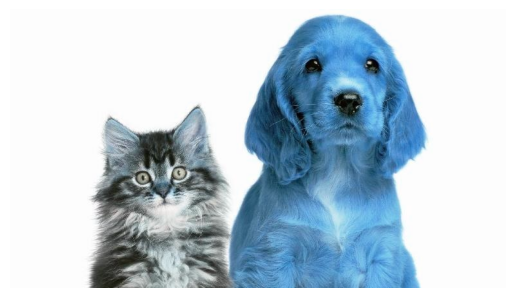

In [5]:
from matplotlib import pyplot as plt
import urllib
import numpy as np
import cv2
import time

url = 'https://akm-img-a-in.tosshub.com/indiatoday/images/story/201812/dogs_and_cats.jpeg?TAxD19DTCFE7WiSYLUdTu446cfW4AbuW&size=770:433'
image_path = "dog-cat.jpg"
urllib.request.urlretrieve(url, image_path)

# Read the image in color mode
image = cv2.imread(image_path, cv2.IMREAD_COLOR)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Transform to RGB


plt.imshow(image)
plt.axis('off')
plt.show()

In [6]:
results = model(image)
print('Results:\n')
print(results)


0: 384x640 1 cat, 1 dog, 325.7ms
Speed: 15.0ms preprocess, 325.7ms inference, 30.6ms postprocess per image at shape (1, 3, 384, 640)
Results:

[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich

In [7]:
results[0].names

{0: 'person',
 1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 4: 'airplane',
 5: 'bus',
 6: 'train',
 7: 'truck',
 8: 'boat',
 9: 'traffic light',
 10: 'fire hydrant',
 11: 'stop sign',
 12: 'parking meter',
 13: 'bench',
 14: 'bird',
 15: 'cat',
 16: 'dog',
 17: 'horse',
 18: 'sheep',
 19: 'cow',
 20: 'elephant',
 21: 'bear',
 22: 'zebra',
 23: 'giraffe',
 24: 'backpack',
 25: 'umbrella',
 26: 'handbag',
 27: 'tie',
 28: 'suitcase',
 29: 'frisbee',
 30: 'skis',
 31: 'snowboard',
 32: 'sports ball',
 33: 'kite',
 34: 'baseball bat',
 35: 'baseball glove',
 36: 'skateboard',
 37: 'surfboard',
 38: 'tennis racket',
 39: 'bottle',
 40: 'wine glass',
 41: 'cup',
 42: 'fork',
 43: 'knife',
 44: 'spoon',
 45: 'bowl',
 46: 'banana',
 47: 'apple',
 48: 'sandwich',
 49: 'orange',
 50: 'broccoli',
 51: 'carrot',
 52: 'hot dog',
 53: 'pizza',
 54: 'donut',
 55: 'cake',
 56: 'chair',
 57: 'couch',
 58: 'potted plant',
 59: 'bed',
 60: 'dining table',
 61: 'toilet',
 62: 'tv',
 63: 'laptop',
 64: 'mou

In [9]:
print(results[0].boxes)

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([16., 15.])
conf: tensor([0.9503, 0.8851])
data: tensor([[336.9828,   8.7521, 646.4073, 429.2642,   0.9503,  16.0000],
        [118.1919, 147.0612, 347.3672, 429.0800,   0.8851,  15.0000]])
id: None
is_track: False
orig_shape: (433, 770)
shape: torch.Size([2, 6])
xywh: tensor([[491.6951, 219.0081, 309.4246, 420.5121],
        [232.7795, 288.0706, 229.1754, 282.0188]])
xywhn: tensor([[0.6386, 0.5058, 0.4019, 0.9712],
        [0.3023, 0.6653, 0.2976, 0.6513]])
xyxy: tensor([[336.9828,   8.7521, 646.4073, 429.2642],
        [118.1919, 147.0612, 347.3672, 429.0800]])
xyxyn: tensor([[0.4376, 0.0202, 0.8395, 0.9914],
        [0.1535, 0.3396, 0.4511, 0.9909]])




cls: tensor([16., 15.])
每个框的类别索引（float 存但语义是 int）：16→dog，15→cat。

conf: tensor([0.9503, 0.8851])
每个框的置信度（0–1）。通常你会据此做阈值过滤（如 >0.25）。

xyxy / xywh / xyxyn / xywhn
同一批框的不同坐标表示：

xyxy: 左上 (x1,y1)、右下 (x2,y2)，像素坐标；

xywh: 框中心 (x,y) + 宽 w、高 h，像素坐标；

xyxyn/xywhn: 与上面一样，但归一化到 [0,1]（n = normalized），便于跨分辨率使用。
例如 xyxyn 里第一行 [0.4376, 0.0202, 0.8395, 0.9914] 表示相对整图宽高的比例。

orig_shape：原图尺寸（H,W），便于把归一化坐标还原为像素。

id/is_track：用于跟踪（多帧视频）时的目标 ID 与是否在跟踪模式。

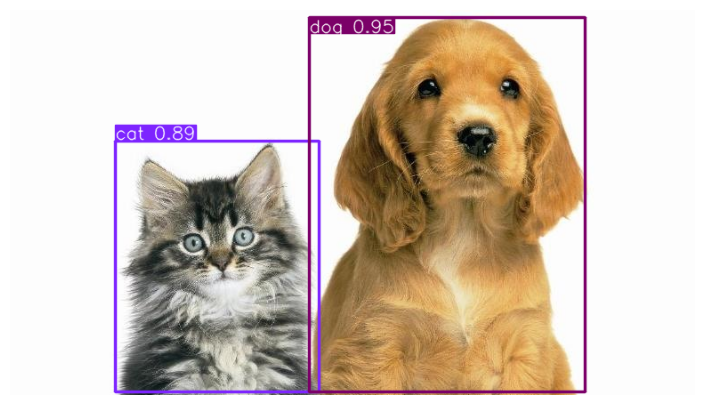

In [10]:
for r in results:
    # Extract the original and annotated images
    original_img = r.orig_img[..., ::-1]
    annotated_image_bgr = r.plot()  # BGR numpy array of predictions
    annotated_image_rgb = annotated_image_bgr[..., ::-1]  # Convert BGR to RGB

    # Plot the annotated image
    plt.figure(figsize=(9, 5))
    plt.imshow(annotated_image_rgb) # RGB PIL image
    plt.axis('off')
    plt.show()

In [11]:
import urllib
import cv2
from matplotlib import pyplot as plt

def download_images(image_urls, plot_images=False):
    """
    Downloads images from the given URLs, converts them to RGB format, and optionally plots them.

    Args:
    image_urls (list of tuples): A list where each tuple contains the image URL and the desired local file path.
    plot_images (bool): If True, the images will be plotted. Defaults to False.

    Returns:
    list: A list of paths where the images have been saved.
    """
    image_paths = []  # Store the local file paths of the images

    for image_url, image_path in image_urls:
        # Download the image from the URL and save it to the local file path
        urllib.request.urlretrieve(image_url, image_path)
        image_paths.append(image_path)  # Add the local file path to the list

        if plot_images:
            # Read the image in color mode
            image = cv2.imread(image_path, cv2.IMREAD_COLOR)
            # Convert the image from BGR to RGB format
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # Plot the image
            plt.figure(figsize=(8, 4))
            plt.imshow(image_rgb)  # Display the image in RGB format
            plt.axis('off')  # Turn off axis labels and ticks
            plt.title(image_path)  # Set the title of the plot as the image path
            plt.show()  # Display the plot

    return image_paths


In [12]:
import ssl

ssl._create_default_https_context = ssl._create_unverified_context


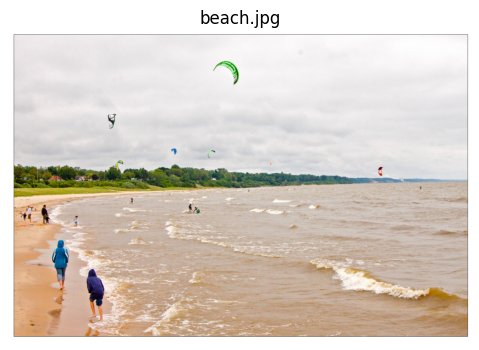

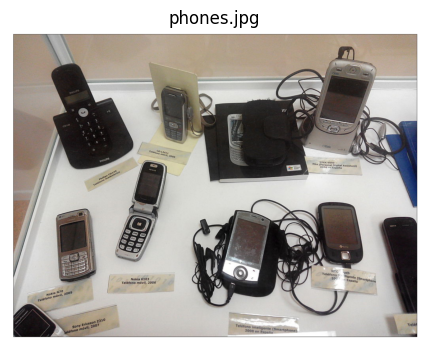

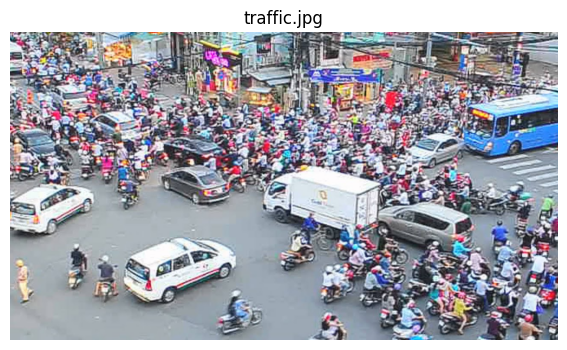

In [14]:
image_urls = [
    ('https://i.ibb.co/R7pRTLy/beach-no-axis.png', 'beach.jpg'),
    ('https://i.ibb.co/jL1kZRF/phones.png', 'phones.jpg'),
    ('https://i.ytimg.com/vi/1ZupwFOhjl4/maxresdefault.jpg', 'traffic.jpg')
]

image_paths = download_images(image_urls, plot_images=True)


0: 640x640 12 persons, 4 kites, 237.2ms
1: 640x640 7 cell phones, 237.2ms
2: 640x640 5 persons, 5 cars, 5 motorcycles, 2 buss, 1 truck, 237.2ms
Speed: 6.4ms preprocess, 237.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


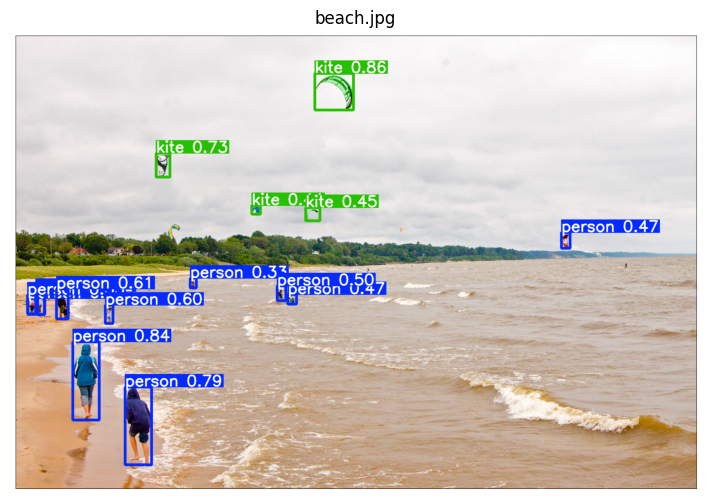

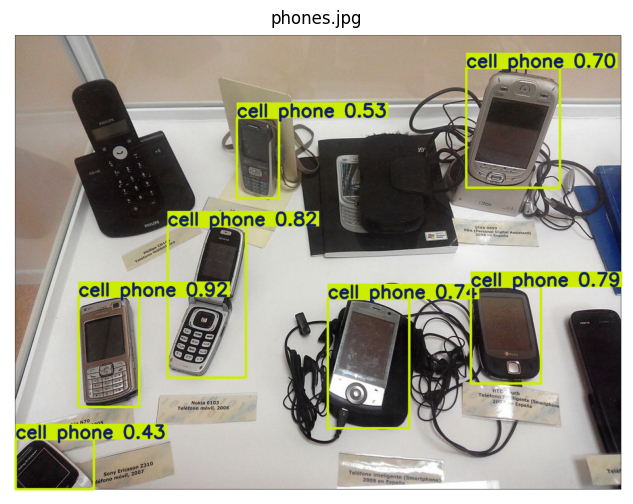

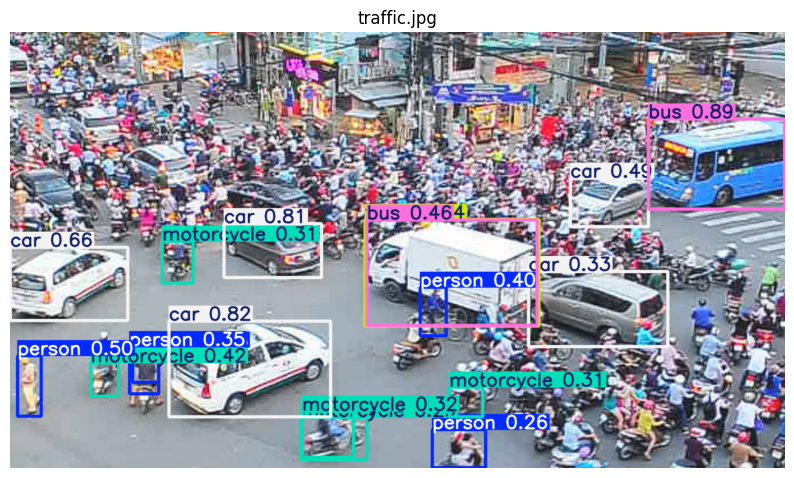

In [15]:
# Run the model
results = model(image_paths)

# Show results
for i, r in enumerate(results):
    # Extract the original and annotated images
    original_img = r.orig_img[..., ::-1]
    annotated_image_bgr = r.plot()  # BGR numpy array of predictions
    annotated_image_rgb = annotated_image_bgr[..., ::-1]  # Convert BGR to RGB

    # Plot the annotated image
    plt.figure(figsize=(10, 6))
    plt.imshow(annotated_image_rgb) # RGB PIL image
    plt.axis('off')
    plt.title(image_paths[i])
    plt.show()


### Compare different models

Model Comparison Summary:
------------------------------------------------------------
Model        | Detections | Inference Time (ms) 
------------------------------------------------------------

0: 384x640 1 person, 3 cars, 2 motorcycles, 2 buss, 1 truck, 148.1ms
Speed: 3.3ms preprocess, 148.1ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)
yolov8n.pt   | 9          | 192.8

0: 384x640 4 cars, 2 buss, 146.8ms
Speed: 3.0ms preprocess, 146.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
yolov10n.pt  | 6          | 190.6

0: 384x640 2 persons, 6 cars, 2 motorcycles, 2 buss, 1 truck, 184.7ms
Speed: 3.1ms preprocess, 184.7ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)
yolo11n.pt   | 13         | 251.2

0: 384x640 1 person, 5 cars, 3 motorcycles, 1 bus, 1 truck, 1179.2ms
Speed: 2.8ms preprocess, 1179.2ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)
yolo12l.pt   | 11         | 1611.1


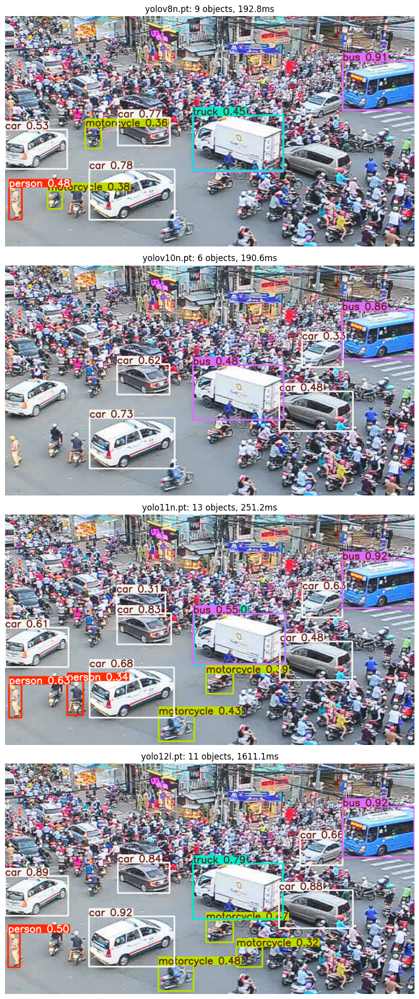

In [16]:
from typing import List
def compare_models(image_path: str, model_names: List[str], conf_threshold: float=0.25):
    """
    Simple function to compare different YOLO models on the same image.
    """

    # Read the image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Set up plot
    fig, axs = plt.subplots(len(model_names), 1, figsize=(10, 5 * len(model_names)))
    if len(model_names) == 1:
        axs = [axs]  # Make it iterable if only one model

    # Print summary header
    print("Model Comparison Summary:")
    print("-" * 60)
    print(f"{'Model':<12} | {'Detections':<10} | {'Inference Time (ms)':<20}")
    print("-" * 60)

    # Process each model
    for i, model_name in enumerate(model_names):
        # Load model
        model = YOLO(model_name)

        # Measure inference time
        start_time = time.time()
        results = model(img_rgb, conf=conf_threshold)
        inference_time = (time.time() - start_time) * 1000  # ms

        # Get detection count
        num_detections = len(results[0].boxes)

        # Plot results
        axs[i].imshow(results[0].plot())
        axs[i].set_title(f"{model_name}: {num_detections} objects, {inference_time:.1f}ms", fontsize=12)
        axs[i].axis('off')

        # Print summary line
        print(f"{model_name:<12} | {num_detections:<10} | {inference_time:.1f}")

    plt.tight_layout()
    plt.show()

compare_models('traffic.jpg', ["yolov8n.pt", "yolov10n.pt", "yolo11n.pt", "yolo12l.pt"], conf_threshold=0.3)

### Non-Max Suppression (NMS) and Intersection Over Union (IoU)

Object detection models, often detect multiple bounding boxes around the same object. This leads to redundant detections for the same object, which is undesirable. To resolve this, two key concepts are utilized: Intersection Over Union (IoU) and Non-Max Suppression (NMS). These techniques help refine the boxes surrounding detected objects, ensuring each object is identified accurately and uniquely.

#### Intersection Over Union (IoU)

IoU is a metric used to quantify the percent overlap between two bounding boxes. It is calculated by dividing the area of overlap between the two boxes by the area of their union:

\begin{equation*}
\text{IoU} = \frac{\text{Area of Overlap}}{\text{Area of Union}}
\end{equation*}

For object detection, IoU is utilized to determine how close a predicted bounding box is to the ground truth bounding box. During evaluation, a higher IoU represents a better prediction by the model.

However, in the context of running inference with a model, IoU is crucial for Non-Max Suppression.

#### Non-Max Suppression (NMS)

Non-Max Suppression is a technique to ensure that only the most probable bounding box for an object is preserved while all other redundant boxes are removed. Here’s how it generally works:

1. Select the box with the highest probability of object detection (confidence score).
2. Compute the IoU of this box with all other boxes. If any box has an IoU greater than a set threshold (typically between 0.5 and 0.7), it is suppressed (i.e., removed).
3. Repeat this process for all boxes until each detected object is represented by only one box.

NMS ensures that in cases where multiple boxes predict the same object, only the most accurate one is kept.

#### Usage in Ultralytics YOLO Inference

When you run inference using the Ultralytics YOLO model, you can control the behavior of NMS and IoU through the inference arguments:

- `conf`: This is the confidence threshold. Detections with a confidence score below this threshold are disregarded before NMS. By adjusting this value, you can filter out weak detections early. **(default 0.25)**
- `iou`: This is the IoU threshold for NMS. In areas where multiple bounding boxes overlap, if the overlap (IoU) is greater than this threshold, only the box with the highest confidence is kept. **(default 0.7)**

Here is how you can use these parameters in practice:

```python
from ultralytics import YOLO

# Load a pretrained YOLO model
model = YOLO('yolov8n.pt')

# Run inference with custom confidence and IoU thresholds
results = model.predict(image, conf=0.25, iou=0.7)
```

一、IoU（交并比）是什么？

定义：两个框的重叠面积 ÷ 并集面积

IoU=Area of Overlap/Area of Union

用途：

评估：预测框和真值框越重合，IoU 越大，说明检测越准。

推理时的 NMS：决定“两个候选框是否太像、该合并/抑制掉一个”。

小例子：两个 100×100 的框，重叠 60×60。

重叠面积 = 3600；并集 = 10000+10000-3600 = 16400；

IoU = 3600 / 16400 ≈ 0.219（重叠不算大）。

二、NMS（非极大值抑制 Non-Max Suppression）干啥的？

问题：同一目标上可能产生很多重叠框。
目标：只保留最有代表性（置信度最高）的那个框。

基本流程：

选出当前最高置信度的框；

计算它与其余框的 IoU；

对 IoU 超过阈值（如 0.5～0.7）的重叠框进行抑制（删除）；

重复直到没有框可处理。

结果：同一目标只留一个框（最可能的那个）。

三、在 Ultralytics/YOLO 里如何用？

推理参数里常见两个阈值：

conf：置信度阈值。低于它的检测先被丢弃，属于“早期去噪”。（默认 0.25）

iou：NMS 的 IoU 阈值。如果两个框重叠超过这个阈值，就只保留置信度更高的那个。（默认 0.7）

#### Question 1: Change confidence and IoU thresholds for detecting more objects

想要“检测更多目标”，思路是放宽筛选 + 减少抑制：

把 conf（置信度阈值）调低 → 允许更多低分框进入 NMS（如 0.25 → 0.15）。

把 iou（NMS 的 IoU 阈值）调高 → 只有“非常重叠”的框才会被视为重复而删除（如 0.70 → 0.80）。

结果：更少被抑制 ⇒ 留下更多框（但可能多些重复或误检）。


0: 640x640 14 persons, 5 kites, 223.8ms
1: 640x640 8 cell phones, 223.8ms
2: 640x640 18 persons, 5 cars, 25 motorcycles, 2 buss, 1 truck, 223.8ms
Speed: 4.3ms preprocess, 223.8ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


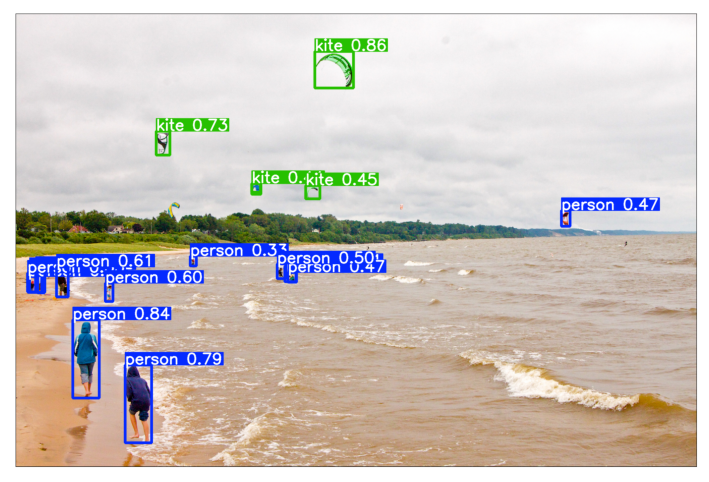

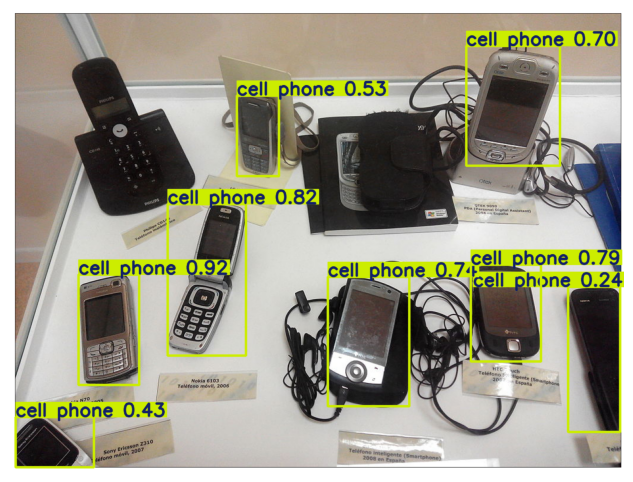

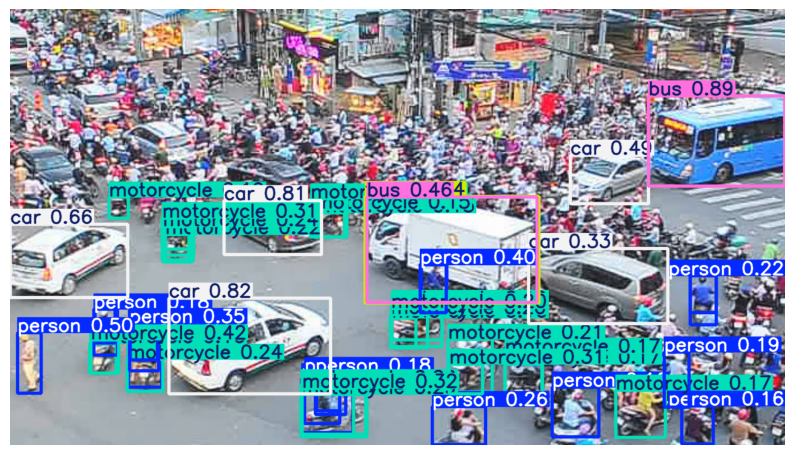

In [17]:
# Run the model
results = model(image_paths, conf=0.15, iou=0.80)

# Show results
for r in results:
    # Extract the original and annotated images
    original_img = r.orig_img[..., ::-1]
    annotated_image_bgr = r.plot()  # BGR numpy array of predictions
    annotated_image_rgb = annotated_image_bgr[..., ::-1]  # Convert BGR to RGB

    # Plot the annotated image
    plt.figure(figsize=(10, 6))
    plt.imshow(annotated_image_rgb) # RGB PIL image
    plt.axis('off')
    plt.show()

## Web cam Local

### Detection loop

The detection loop consists of four phases:

- Loading the webcam frame

- Running the image through the model

- Updating the output with the resulting predictions

In [ ]:
from PIL import Image
from IPython.display import Image as IPyImage

cap = cv2.VideoCapture(0)
time.sleep(1)  ### letting the camera autofocus

axes = None
NUM_FRAMES = 50  # you can change this
processed_imgs = []
for i in range(NUM_FRAMES):
    # Load frame from the camera
    ret, frame = cap.read()

    # Run the model
    result = model(frame, verbose=False)
    annotated_image_bgr = result[0].plot()
    annotated_image_rgb = annotated_image_bgr[:,:, ::-1]  # Convert BGR to RGB

    img = Image.fromarray(np.uint8(annotated_image_rgb))
    processed_imgs.append(img)
    cv2.imshow("test", annotated_image_bgr)
    cv2.waitKey(1)

cap.release()
cv2.destroyAllWindows()

In [ ]:
## create gif
processed_imgs[0].save('web_cam.gif',
                       format='GIF',
                       append_images=processed_imgs[1:],
                       save_all=True,
                       duration=100,
                       loop=0)

In [ ]:
# IPyImage('web_cam.gif', format='png', width=15 * 40, height=3 * 40)

## Question 2: Traffic Scene  Object Detection

In [20]:
## load the scene gif
url_1 = 'https://i.ibb.co/wpHvb58/scene1.gif'
scene_1_path = 'scene_1.gif'
urllib.request.urlretrieve(url_1, scene_1_path)

KeyboardInterrupt: 

In [ ]:
# IPyImage(scene_1_path, format='png', width=15 * 40, height=3 * 40)

from PIL import Image
from IPython.display import Image as IPyImage


IPyImage(url=url_1)

In [ ]:
model = YOLO('yolov8x.pt')  # load a pretrained YOLOv8n detection, v9 model:  YOLO('yolov9c.pt')

In [ ]:
from tqdm import tqdm

gif_object = Image.open(scene_1_path)

# Display individual frames from the loaded animated GIF file
processed_imgs = []
for _, ind in tqdm(enumerate(range(0, gif_object.n_frames))):
    gif_object.seek(ind)
    ## frame in numpy array format (512, 512, 3)
    frame = np.array(gif_object.convert('RGB'))[:,:,::-1]

    ## Object Detection code
    ...

    img = Image.fromarray(np.uint8(annotated_image_rgb))
    processed_imgs.append(img)

In [ ]:
## save the processed scene gif
processed_imgs[0].save('scene1_boxes.gif',
                       format='GIF',
                       append_images=processed_imgs[1:],
                       save_all=True,
                       duration=200,
                       loop=0)

In [ ]:
IPyImage('scene1_boxes.gif', format='png', width=15 * 40, height=3 * 40)

## YOLO for Different Vision Tasks

###  Segmentation

Segmentation models, indicated by the `-seg` suffix (e.g., `yolov8n-seg.pt`), are designed for more detailed analysis. These models not only detect objects but also delineate their exact shapes, segmenting each object from the background and other objects.




分割（Segmentation）

带有 -seg 后缀（如 yolov8n-seg.pt）的分割模型用于进行更精细的分析。它们不仅能检测目标，还能勾勒出目标的准确形状，将每个对象从背景和其他对象中逐一分离出来。

In [21]:
model = YOLO('yolo11n-seg.pt')

In [22]:
help(model)

Help on YOLO in module ultralytics.models.yolo.model object:

class YOLO(ultralytics.engine.model.Model)
 |  YOLO(model: 'str | Path' = 'yolo11n.pt', task: 'str | None' = None, verbose: 'bool' = False)
 |
 |  YOLO (You Only Look Once) object detection model.
 |
 |  This class provides a unified interface for YOLO models, automatically switching to specialized model types
 |  (YOLOWorld or YOLOE) based on the model filename. It supports various computer vision tasks including object
 |  detection, segmentation, classification, pose estimation, and oriented bounding box detection.
 |
 |  Attributes:
 |      model: The loaded YOLO model instance.
 |      task: The task type (detect, segment, classify, pose, obb).
 |      overrides: Configuration overrides for the model.
 |
 |  Methods:
 |      __init__: Initialize a YOLO model with automatic type detection.
 |      task_map: Map tasks to their corresponding model, trainer, validator, and predictor classes.
 |
 |  Examples:
 |      Load a 


image 1/1 /content/traffic.jpg: 384x640 4 persons, 5 cars, 1 motorcycle, 2 buss, 252.5ms
Speed: 3.8ms preprocess, 252.5ms inference, 24.1ms postprocess per image at shape (1, 3, 384, 640)


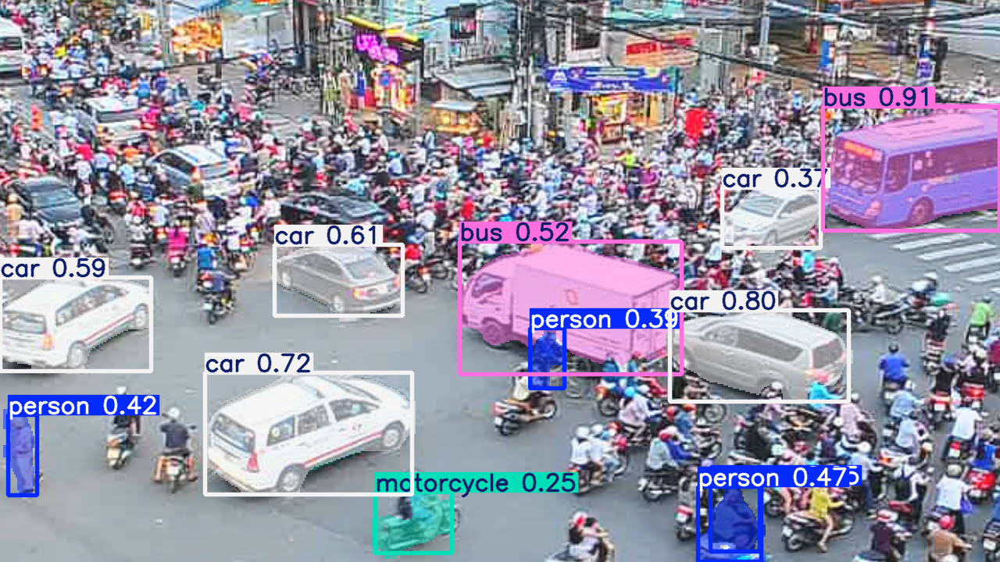

In [23]:
results = model('traffic.jpg')
results[0].show()  # Display the segmentation results

res.masks

分割结果对象，只有 -seg 模型才有：

res.masks.data：形状 [N, H, W] 的布尔/0-1 mask（每个实例一张）。

res.masks.xy：每个实例的多边形点集（像素坐标）。

res.masks.xyn：归一化多边形（0–1）。

res.names

类别索引到名称的字典（COCO 80 类）。

In [24]:
res = results[0]
res

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair

In [ ]:
res.masks

In [ ]:
res.names

简单说：掩码就是一张“选择/遮挡图”。它用来指示哪些位置要保留、处理或忽略。常见是二值的：

1 / True（白）：选中、保留、可见

0 / False（黑）：不选、丢弃、隐藏

在不同场景里的含义——

图像分割 / 视觉

掩码是一张与原图同大小的二值图，标出目标像素。

用途：抠图、计算面积/IoU、只对目标区域做滤镜等。

例：masked_img[~mask] = 0 把非目标像素置黑。

NumPy / 数据处理（布尔掩码）

用 True/False 选择数组元素：x[mask] 只取满足条件的元素。

位运算（bitmask）

用二进制位的 0/1 控制开启/关闭：flags & 0b0101。

深度学习（attention mask / padding mask）

指示哪些 token 参与注意力计算，哪些是填充需要忽略。

一句话记忆：掩码 = 用 0/1（或 True/False）标记“该不该算/该不该看”的开关图或数组。

这是一个把 YOLO 实例分割结果中的某个目标的多边形轮廓，转换成像素级二值掩码的函数

从 Results.masks.xy 读取实例的多边形轮廓 →

按原图大小生成空白掩码 →

用 OpenCV 实心绘制多边形得到像素级二值掩码 →

返回 bool 类型的 mask。

In [26]:
from ultralytics.engine.results import Results

def extract_segmentation_mask(
    detection_result: Results,
    object_index: int = 0
) -> np.ndarray:
    """
    Extracts a binary segmentation mask for a specific detected object.

    This function creates a precise binary mask from YOLO segmentation contours
    where white pixels (255) represent the object and black pixels (0) represent
    the background.

    Parameters:
        detection_result: The YOLO Results object containing segmentation data
        object_index: The index of the object to extract (0 for first detection)

    Returns:
        A binary mask as a NumPy array of type uint8
    """
    # Verify the inputs
    if detection_result.masks is None:
        raise ValueError("No segmentation masks found in detection results")

    if object_index >= len(detection_result.masks.xy):
        raise IndexError(f"Object index {object_index} is out of range. "
                         f"Only {len(detection_result.masks.xy)} objects detected.")

    # Get original image dimensions
    height, width = detection_result.orig_img.shape[:2]

    # Create an empty mask with the original image dimensions
    binary_mask = np.zeros((height, width), dtype=np.uint8)

    # Get the contour points from the detection result
    contour_points = detection_result.masks.xy[object_index]

    # Format the contour for OpenCV's drawContours function
    formatted_contour = contour_points.astype(np.int32).reshape(-1, 1, 2)

    # Draw the filled contour onto the empty mask
    cv2.drawContours(binary_mask, [formatted_contour], -1, 255, cv2.FILLED)

    # Convert the mask to a binary format
    binary_mask = binary_mask.astype(bool)

    return binary_mask

把每个检测到的实例用分割掩码mask抠出来，其他背景置黑并显示

__________________________________________________
bus


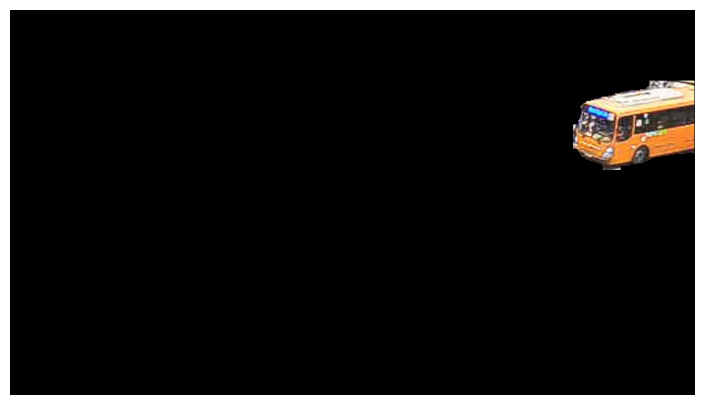

__________________________________________________
car


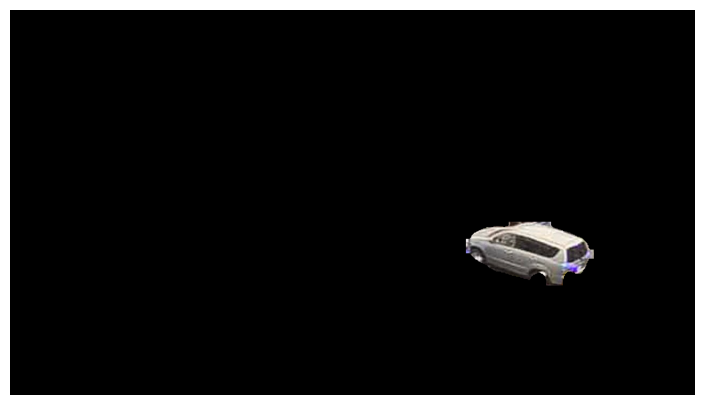

In [27]:
img = np.copy(res.orig_img)

for object_index in range(len(res.boxes.cls.tolist())):
    if object_index == 2:
        break
    # Get class label
    label = res.names[res.boxes.cls.tolist()[object_index]]
    print('_'*50)
    print(label)

    # Create the binary mask for the object
    b_mask = extract_segmentation_mask(res, object_index)

    # Create the isolated image from the binary b_mask
    masked_img = img.copy()
    # Set background to black
    masked_img[~b_mask] = 0

    plt.figure(figsize=(9, 5))
    plt.imshow(masked_img) # RGB PIL image
    plt.axis('off')
    plt.show()

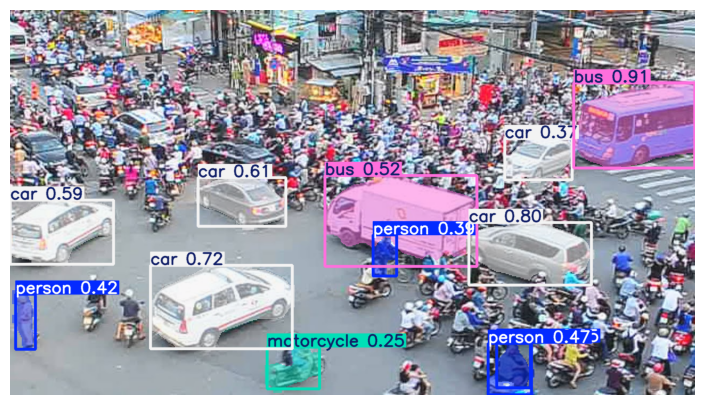

In [28]:
annotated_image_bgr = res.plot()  # BGR numpy array of predictions
annotated_image_rgb = annotated_image_bgr[..., ::-1]  # Convert BGR to RGB

# Plot the annotated image
plt.figure(figsize=(9, 5))
plt.imshow(annotated_image_rgb) # RGB PIL image
plt.axis('off')
plt.show()

#### Working with Segmentation Masks: Visualization and Manipulation

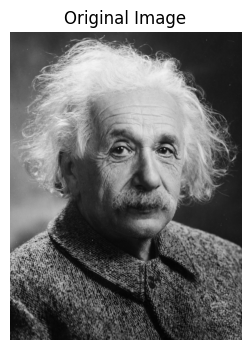

In [31]:
from urllib.request import Request, urlopen
from PIL import Image
from io import BytesIO


url = 'https://upload.wikimedia.org/wikipedia/commons/d/d3/Albert_Einstein_Head.jpg'
image_path = 'einstein.jpg'
# urllib.request.urlretrieve(url, image_path)

req = Request(url, headers={"User-Agent": "Mozilla/5.0"})
with urlopen(req, timeout=15) as resp:
    data = resp.read()

# 保存或直接打开
with open("einstein.jpg", "wb") as f:
    f.write(data)

# Load and display image
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(4, 4))
plt.imshow(image_rgb)
plt.axis('off')
plt.title('Original Image')
plt.show()


0: 640x480 1 person, 216.4ms
Speed: 5.6ms preprocess, 216.4ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 480)


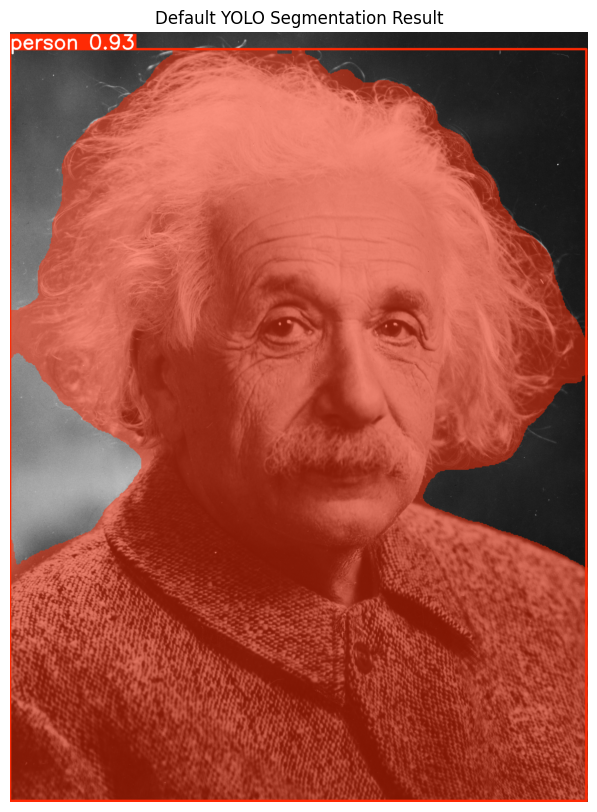

In [32]:
# Run segmentation
results = model(image, conf=0.3)  # Lower confidence threshold for our example
result = results[0]

# Display the default visualization
plt.figure(figsize=(10, 10))
plt.imshow(result.plot())
plt.axis('off')
plt.title('Default YOLO Segmentation Result')
plt.show()

##### Explore the Segmentation Data Structure

In [33]:
print("Available attributes in result:")
print(dir(result))

# Check mask information
if result.masks is not None:
    print("\nMask information:")
    print(f"Number of masks: {len(result.masks)}")
    print(f"Shape of first mask: {result.masks.data[0].shape}")
    print(f"Data type: {result.masks.data[0].dtype}")

    # Get class information
    if len(result.boxes) > 0:
        print("\nDetected classes:")
        for i, box in enumerate(result.boxes):
            class_id = int(box.cls)
            class_name = result.names[class_id]
            confidence = float(box.conf)
            print(f"Object {i+1}: {class_name} (Confidence: {confidence:.2f})")

Available attributes in result:
['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattr__', '__getattribute__', '__getitem__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_apply', '_keys', 'boxes', 'cpu', 'cuda', 'keypoints', 'masks', 'names', 'new', 'numpy', 'obb', 'orig_img', 'orig_shape', 'path', 'plot', 'probs', 'save', 'save_crop', 'save_dir', 'save_txt', 'show', 'speed', 'summary', 'to', 'to_csv', 'to_df', 'to_json', 'update', 'verbose']

Mask information:
Number of masks: 1
Shape of first mask: torch.Size([640, 480])
Data type: torch.uint8

Detected classes:
Object 1: person (Confidence: 0.93)


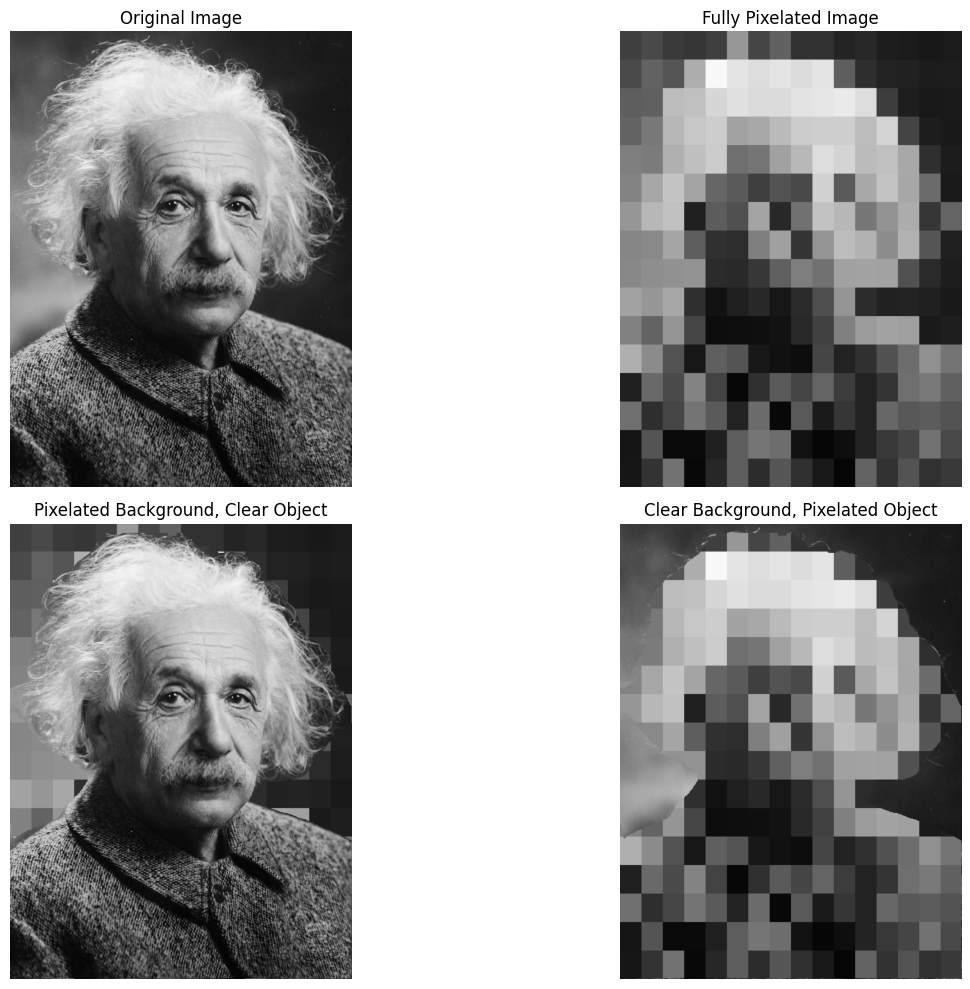

In [34]:
def pixelate(image, blocks=16):
    """Heavily pixelate an image region by downsampling and upsampling"""
    # Get dimensions
    h, w = image.shape[:2]

    # Downsample
    temp = cv2.resize(image, (blocks, blocks), interpolation=cv2.INTER_LINEAR)

    # Upsample back to original size
    return cv2.resize(temp, (w, h), interpolation=cv2.INTER_NEAREST)

# Step 1: Make sure we have a mask for the detected object
if result.masks is not None and len(result.masks) > 0:
    # Get the mask for the first detected object
    object_mask = extract_segmentation_mask(result, 0)

    # Step 2: Create a pixelated version of the entire image
    pixelated_image = pixelate(image, blocks=16)

    # Step 3: Create two different pixelation effects

    # Example 1: Pixelate everything EXCEPT the object
    inverse_pixelation = pixelated_image.copy()
    inverse_pixelation[object_mask] = image_rgb[object_mask]

    # Example 2: Pixelate ONLY the object
    object_pixelation = image_rgb.copy()
    object_pixelation[object_mask] = pixelated_image[object_mask]

    # Display the results
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(pixelated_image)
    plt.title('Fully Pixelated Image')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(inverse_pixelation)
    plt.title('Pixelated Background, Clear Object')
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(object_pixelation)
    plt.title('Clear Background, Pixelated Object')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

### Question 3: Real-time Person Pixelation with Webcam

For this final exercise, create a webcam application that automatically detects and pixelates all people in the frame while keeping the rest of the image clear.

In [ ]:
from PIL import Image
from IPython.display import Image as IPyImage
import cv2
import numpy as np
import time
from ultralytics import YOLO
from tqdm import tqdm


# Load the YOLO segmentation model
model = YOLO(...)

# Initialize webcam
cap = cv2.VideoCapture(0)
time.sleep(1)  # Letting the camera autofocus

# Parameters
NUM_FRAMES = 200  # Number of frames to capture
processed_imgs = []


# Process webcam feed
for i in tqdm(range(NUM_FRAMES)):
    # Load frame from the camera
    ret, frame = cap.read()
    if not ret:
        break

    # Make a copy for visualization
    display_frame = frame.copy()

    # Run YOLO segmentation
    results = model(frame, verbose=False)
    result = results[0]

    # Find the person class ID
    # Hint: Look through result.names dictionary to find the 'person' class
    person_class_id = ...

    # Create pixelated version of the entire frame
    pixelated_frame = pixelate(frame, blocks=10)

    # Check if any people were detected
    if result.masks is not None and len(result.boxes) > 0:
        # Create a combined mask for all people
        h, w = frame.shape[:2]
        people_mask = np.zeros((h, w), dtype=bool)

        # Process each detected person
        for i, box in enumerate(result.boxes):
            # Use the correct class ID to identify people
            if ...:
                # Use the extract_segmentation_mask function
                # to get the mask for this person
                current_mask = ...

                # Combine with the overall people mask
                people_mask = ...

        # Apply pixelation only to people areas
        # Use boolean indexing to replace only the masked areas
        ...

    # Display the processed frame
    cv2.putText(display_frame, "People Pixelation", (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    cv2.imshow("Privacy Filter", display_frame)

    # Convert to RGB for PIL and save to list
    display_rgb = cv2.cvtColor(display_frame, cv2.COLOR_BGR2RGB)
    img = Image.fromarray(np.uint8(display_rgb))
    processed_imgs.append(img)

    # Exit if 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release resources
cap.release()
cv2.destroyAllWindows()

# Save processed frames as a GIF
# Complete the code to save the frames as a GIF
if processed_imgs:
    ...



In [ ]:
# Display the GIF
try:
    IPyImage('webcam_pixelated_people.gif', format='png', width=15 * 40, height=10 * 40)
except:
    print("GIF display failed. The file should still be saved.")

### Pose

Pose estimation models, identified by the `-pose` suffix (e.g., `yolov8n-pose.pt`), are specialized in detecting human figures and estimating their postures by identifying key body points.

姿态（Pose）

带有 -pose 后缀（如 yolov8n-pose.pt）的模型专门用于人体姿态估计：它们能够检测出人体，并通过识别**关键点（关键人体关节/部位）**来估计人的姿势。

In [35]:
model = YOLO('yolov8l-pose.pt')

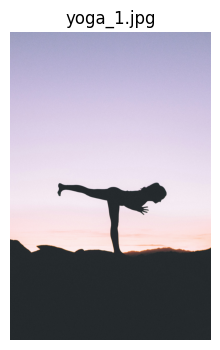

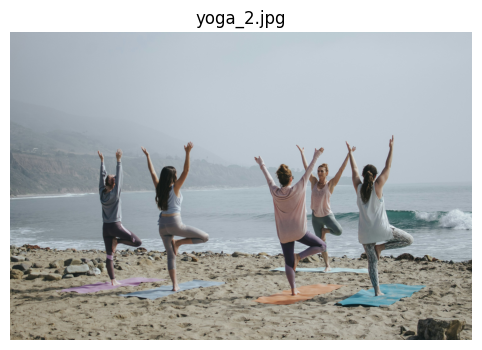

In [36]:
image_urls = [
    (
        'https://images.unsplash.com/photo-1561049501-e1f96bdd98fd?q=80&w=2778&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D',
        'yoga_1.jpg'
    ),
    (
        'https://images.unsplash.com/photo-1545205597-3d9d02c29597?q=80&w=2940&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D',
        'yoga_2.jpg'
    ),
]
image_paths = download_images(image_urls, plot_images=True)


0: 640x640 1 person, 2816.8ms
1: 640x640 5 persons, 2816.8ms
Speed: 4.6ms preprocess, 2816.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


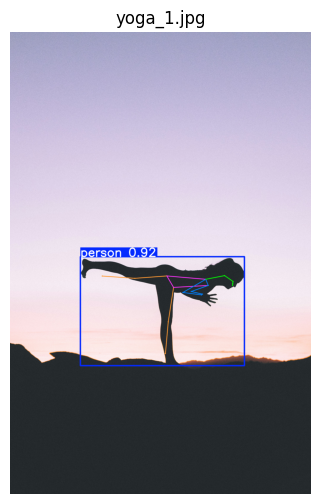

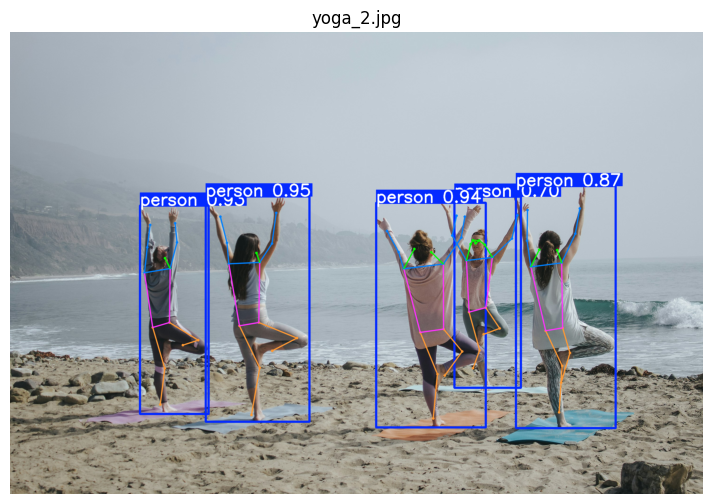

In [37]:
# Run the model
results = model(image_paths)

# Show results
for i, r in enumerate(results):
    # Extract the original and annotated images
    original_img = r.orig_img[..., ::-1]
    annotated_image_bgr = r.plot()  # BGR numpy array of predictions
    annotated_image_rgb = annotated_image_bgr[..., ::-1]  # Convert BGR to RGB

    # Plot the annotated image
    plt.figure(figsize=(10, 6))
    plt.imshow(annotated_image_rgb) # RGB PIL image
    plt.axis('off')
    plt.title(image_paths[i])
    plt.show()

In [38]:
r.keypoints.conf.shape

torch.Size([5, 17])

In [39]:
r.keypoints.conf

tensor([[0.1550, 0.0115, 0.0910, 0.2416, 0.9176, 0.9986, 0.9990, 0.9904, 0.9959, 0.9707, 0.9849, 0.9999, 0.9999, 0.9994, 0.9995, 0.9925, 0.9947],
        [0.1070, 0.0116, 0.0642, 0.2850, 0.8952, 0.9967, 0.9987, 0.9767, 0.9944, 0.9172, 0.9687, 0.9996, 0.9997, 0.9977, 0.9984, 0.9773, 0.9849],
        [0.2140, 0.0156, 0.1449, 0.1611, 0.9196, 0.9976, 0.9985, 0.9841, 0.9945, 0.9626, 0.9841, 0.9998, 0.9998, 0.9983, 0.9987, 0.9777, 0.9844],
        [0.0419, 0.0076, 0.0213, 0.3563, 0.7045, 0.9932, 0.9972, 0.9600, 0.9906, 0.8493, 0.9500, 0.9994, 0.9996, 0.9975, 0.9986, 0.9819, 0.9898],
        [0.9913, 0.9876, 0.9484, 0.9316, 0.4973, 0.9982, 0.9837, 0.9862, 0.7569, 0.9801, 0.8099, 0.9972, 0.9920, 0.9941, 0.9831, 0.9790, 0.9474]])

In [40]:
help(r)

Help on Results in module ultralytics.engine.results object:

class Results(ultralytics.utils.SimpleClass, ultralytics.utils.DataExportMixin)
 |  Results(orig_img: 'np.ndarray', path: 'str', names: 'dict[int, str]', boxes: 'torch.Tensor | None' = None, masks: 'torch.Tensor | None' = None, probs: 'torch.Tensor | None' = None, keypoints: 'torch.Tensor | None' = None, obb: 'torch.Tensor | None' = None, speed: 'dict[str, float] | None' = None) -> 'None'
 |
 |  A class for storing and manipulating inference results.
 |
 |  This class provides comprehensive functionality for handling inference results from various
 |  Ultralytics models, including detection, segmentation, classification, and pose estimation.
 |  It supports visualization, data export, and various coordinate transformations.
 |
 |  Attributes:
 |      orig_img (np.ndarray): The original image as a numpy array.
 |      orig_shape (tuple[int, int]): Original image shape in (height, width) format.
 |      boxes (Boxes | None): D

Object Detection → Boxes（边界框）
用一个矩形框出对象的位置与大小：[x1, y1, x2, y2] 或 [cx, cy, w, h]，并带类别和置信度。
A rectangle locating the object, with class and confidence.

Segmentation → Mask（掩码）
与原图同尺寸的二值/多边图，精确到像素级轮廓，标出目标属于/不属于的位置。
Pixel-accurate silhouette of the object (binary or polygons).

Pose → Keypoints（关键点） ✅ 你问的“含义”
关键点是人体（或物体）上具有语义的坐标点，比如：鼻尖、左右眼、左右耳、左右肩、肘、腕、髋、膝、踝等。
Keypoints are semantic landmark coordinates on the subject (e.g., nose, eyes, shoulders, elbows, wrists, hips, knees, ankles).

常见规范：

COCO 人体 17 点（nose、L/R eye、L/R ear、L/R shoulder、L/R elbow、L/R wrist、L/R hip、L/R knee、L/R ankle）。

每个点通常提供：(x, y, score)，其中 score 是该点的可见度/置信度。

模型还会给出**骨架（skeleton）连接关系，用线段把关键点串成“骨架图”，便于计算关节角度、动作幅度、姿态评分、计数（如深蹲/俯卧撑）**等。